# Allstate Corporation

## Imports

In [3]:
# data analysis and data wrangling
import numpy as np
import pandas as pd

!pip install missingno

# plotting
import seaborn as sns
import matplotlib.pyplot as plt
import missingno as msno

# PCA
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from mpl_toolkits.mplot3d import Axes3D

# Preprocessing
from sklearn.preprocessing import LabelEncoder
from sklearn.ensemble import RandomForestClassifier  # enbedded method

# machine learning
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestRegressor
from xgboost import XGBRegressor
import xgboost as xgb

# metrics
from sklearn.metrics import mean_absolute_error
from sklearn.model_selection import KFold

# Other
from IPython.display import Image
import configparser
import subprocess
import warnings
import pprint
import time
import os

## Format cell

In [4]:
# Guarantees visualization inside the jupyter
%matplotlib inline

# formata os dados de todas as tabelas (ponto flutuante com 2 casas)
pd.options.display.float_format = '{:.2f}'.format

# parametros de config
rc={'savefig.dpi': 500, 
    'figure.autolayout': True, 
    'figure.figsize': [15, 8], 
    'axes.labelsize': 18,
    'axes.titlesize': 18, 
    'font.size': 15, 
    'lines.linewidth': 1.0, 
    'lines.markersize': 8, 
    'legend.fontsize': 15,
    'xtick.labelsize': 15, 
    'ytick.labelsize': 15}

# Print all rows and columns. Dont hide any
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)

# Definition color and map de colors
default_color = '#56B4E9'
colormap = plt.cm.cool

# Supress unnecessary warnings so that presentation looks clean
warnings.filterwarnings('ignore')

# graph style
sns.set(style='dark',rc=rc)

# pretty print
pp = pprint.PrettyPrinter(indent=4)

### Load dataset

In [5]:
%%time

# load data in dataset
df_train = pd.read_csv("train.csv", 
                       encoding='utf-8')
df_test = pd.read_csv("test.csv", 
                      encoding='utf-8')

Wall time: 5.68 s


### Global Variables

In [6]:
# Lists that will be manipulated in the data processing
list_columns = []
list_categorical_col = []
list_numerical_col = []

In [7]:
def get_col(df: 'dataframe', type_descr: 'numpy') -> list:
    """
    Function get list columns 
    
    Args:
    type_descr
        np.number, np.object -> return list with all columns
        np.number            -> return list numerical columns 
        np.object            -> return list object columns
    """
    try:
        col = (df.describe(include=type_descr).columns)  # pandas.core.indexes.base.Index  
    except ValueError:
        print(f'Dataframe not contains {type_descr} columns !', end='\n')    
    else:
        return col.tolist() 

In [8]:
list_numerical_col = get_col(df=df_train,
                             type_descr=np.number)
list_categorical_col = get_col(df=df_train,
                               type_descr=np.object)
list_columns = get_col(df=df_train,
                       type_descr=[np.object, np.number])

---

## Data Exploration 

#### Datasets
The dataset contains 2 .csv files with information needed to make a forecast. They are::<br/>
1. Variables in train.csv and test.csv: 
 - **id:** the id of a couple of questions from the training set
 - **cat1 to cat116:** category variables (the range of values is not provided, nor the column names).
 - **cont1 to cont14:** continuous variables (the range of values is not provided nor the names of the columns).
 - **loss:** the amount that the company has to pay for a particular claim. This is the target variable.
 
 
 NOTE: In test.csv, the loss is not present, since we will predict this.

In [9]:
# Size and types of the dataframe
df_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 188318 entries, 0 to 188317
Columns: 132 entries, id to loss
dtypes: float64(15), int64(1), object(116)
memory usage: 189.7+ MB


In [10]:
print("Dataframe:\n{} rows\n{} columns"
      .format(df_train.shape[0],
              df_train.shape[1]))

Dataframe:
188318 rows
132 columns


In [11]:
df_test.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 125546 entries, 0 to 125545
Columns: 131 entries, id to cont14
dtypes: float64(14), int64(1), object(116)
memory usage: 125.5+ MB


In [12]:
print("Dataframe:\n{} rows\n{} columns"
      .format(df_test.shape[0],
              df_test.shape[1]))

Dataframe:
125546 rows
131 columns


### Data Type
Within _data_ there are 3 types of data: <br/>
- float64(15) = continuos_feature + loss
- int64(1) = id
- object(116) = categorical_feature

In [13]:
df_train.head()

,id,cat1,cat2,cat3,cat4,cat5,cat6,cat7,cat8,cat9,cat10,cat11,cat12,cat13,cat14,cat15,cat16,cat17,cat18,cat19,cat20,cat21,cat22,cat23,cat24,cat25,cat26,cat27,cat28,cat29,cat30,cat31,cat32,cat33,cat34,cat35,cat36,cat37,cat38,cat39,cat40,cat41,cat42,cat43,cat44,cat45,cat46,cat47,cat48,cat49,cat50,cat51,cat52,cat53,cat54,cat55,cat56,cat57,cat58,cat59,cat60,cat61,cat62,cat63,cat64,cat65,cat66,cat67,cat68,cat69,cat70,cat71,cat72,cat73,cat74,cat75,cat76,cat77,cat78,cat79,cat80,cat81,cat82,cat83,cat84,cat85,cat86,cat87,cat88,cat89,cat90,cat91,cat92,cat93,cat94,cat95,cat96,cat97,cat98,cat99,cat100,cat101,cat102,cat103,cat104,cat105,cat106,cat107,cat108,cat109,cat110,cat111,cat112,cat113,cat114,cat115,cat116,cont1,cont2,cont3,cont4,cont5,cont6,cont7,cont8,cont9,cont10,cont11,cont12,cont13,cont14,loss
0,1,A,B,A,B,A,A,A,A,B,A,B,A,A,A,A,A,A,A,A,A,A,A,B,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,B,A,D,B,B,D,D,B,D,C,B,D,B,A,A,A,A,A,D,B,C,E,A,C,T,B,G,A,A,I,E,G,J,G,BU,BC,C,AS,S,A,O,LB,0.73,0.25,0.19,0.79,0.31,0.72,0.34,0.30,0.67,0.84,0.57,0.59,0.82,0.71,2213.18
1,2,A,B,A,A,A,A,A,A,B,B,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,D,B,B,D,D,A,B,C,B,D,B,A,A,A,A,A,D,D,C,E,E,D,T,L,F,A,A,E,E,I,K,K,BI,CQ,A,AV,BM,A,O,DP,0.33,0.74,0.59,0.61,0.89,0.44,0.44,0.60,0.35,0.44,0.34,0.37,0.61,0.30,1283.60
2,5,A,B,A,A,B,A,A,A,B,B,B,B,B,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,B,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,D,B,B,B,D,B,D,C,B,B,B,A,A,A,A,A,D,D,C,E,E,A,D,L,O,A,B,E,F,H,F,A,AB,DK,A,C,AF,A,I,GK,0.26,0.36,0.48,0.24,0.40,0.29,0.32,0.27,0.26,0.32,0.38,0.37,0.20,0.77,3005.09
3,10,B,B,A,B,A,A,A,A,B,A,A,A,A,A,A,A,A,A,A,A,A,A,B,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,B,A,A,A,D,B,B,D,D,D,B,C,B,D,B,A,A,A,A,A,D,D,C,E,E,D,T,I,D,A,A,E,E,I,K,K,BI,CS,C,N,AE,A,O,DJ,0.32,0.56,0.53,0.37,0.42,0.44,0.39,0.32,0.32,0.44,0.33,0.32,0.61,0.60,939.85
4,11,A,B,A,B,A,A,A,A,B,B,A,B,A,A,A,A,A,A,A,A,A,A,B,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,B,A,A,A,A,D,B,D,B,D,B,B,C,B,B,C,A,A,A,B,H,D,B,D,E,E,A,P,F,J,A,A,D,E,K,G,B,H,C,C,Y,BM,A,K,CK,0.27,0.16,0.53,0.47,0.70,0.18,0.25,0.25,0.22,0.21,0.20,0.20,0.25,0.43,2763.85


In [14]:
# Types data in collumns
print(df_train.columns)

Index(['id', 'cat1', 'cat2', 'cat3', 'cat4', 'cat5', 'cat6', 'cat7', 'cat8',
       'cat9',
       ...
       'cont6', 'cont7', 'cont8', 'cont9', 'cont10', 'cont11', 'cont12',
       'cont13', 'cont14', 'loss'],
      dtype='object', length=132)


In [15]:
def show_measures_location(df: 'dataframe', type_descr: 'list') -> None:
    """
    Function get measures localization + total col + % type columns 
    Handler when type data not exists
    
    Args:
    type_descr
        np.number, np.object  -> return summary statistic with all columns
        np.number             -> return summary statistic numerical columns 
        np.object             -> return summary statistic object columns
    """
    try:
        col = (df.describe(include=type_descr).columns)  # pandas.core.indexes.base.Index  
    except ValueError:
        print(f'Dataframe not contains {type_descr} columns !', end='\n\n')    
    else:
        list_col = col.tolist()
        percentage = (len(list_col) / df.shape[1]) * 100
        
        print("-"*25, "MEASURES OF LOCALIZATION", "-"*25, end='\n\n')
        print(f"TOTAL columns {type_descr}: {len(list_col)}")
        print("PERCENTAGE {} in dataframe: {:3.4} %".format(type_descr, percentage))
        
        return df.describe(include=type_descr)

In [19]:
show_measures_location(df=df_train,
                       type_descr=[np.number, np.object])

------------------------- MEASURES OF LOCALIZATION -------------------------

TOTAL columns [<class 'numpy.number'>, <class 'object'>]: 132
PERCENTAGE [<class 'numpy.number'>, <class 'object'>] in dataframe: 100.0 %


,id,cat1,cat2,cat3,cat4,cat5,cat6,cat7,cat8,cat9,cat10,cat11,cat12,cat13,cat14,cat15,cat16,cat17,cat18,cat19,cat20,cat21,cat22,cat23,cat24,cat25,cat26,cat27,cat28,cat29,cat30,cat31,cat32,cat33,cat34,cat35,cat36,cat37,cat38,cat39,cat40,cat41,cat42,cat43,cat44,cat45,cat46,cat47,cat48,cat49,cat50,cat51,cat52,cat53,cat54,cat55,cat56,cat57,cat58,cat59,cat60,cat61,cat62,cat63,cat64,cat65,cat66,cat67,cat68,cat69,cat70,cat71,cat72,cat73,cat74,cat75,cat76,cat77,cat78,cat79,cat80,cat81,cat82,cat83,cat84,cat85,cat86,cat87,cat88,cat89,cat90,cat91,cat92,cat93,cat94,cat95,cat96,cat97,cat98,cat99,cat100,cat101,cat102,cat103,cat104,cat105,cat106,cat107,cat108,cat109,cat110,cat111,cat112,cat113,cat114,cat115,cat116,cont1,cont2,cont3,cont4,cont5,cont6,cont7,cont8,cont9,cont10,cont11,cont12,cont13,cont14,loss
count,188318.00,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318.00,188318.00,188318.00,188318.00,188318.00,188318.00,188318.00,188318.00,188318.00,188318.00,188318.00,188318.00,188318.00,188318.00,188318.00
unique,nan,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,3,3,3,3,4,4,4,4,4,4,4,4,4,4,4,4,8,7,8,7,5,7,5,8,7,5,16,15,19,9,13,17,20,17,20,11,84,131,16,51,61,19,23,326,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan
top,nan,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,D,B,B,D,D,B,B,C,B,B,B,A,A,A,A,A,D,D,C,E,C,A,P,F,A,A,A,E,E,G,F,B,BI,CL,A,E,BM,A,K,HK,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan
freq,nan,141550,106721,177993,128395,123737,131693,183744,177274,113122,160213,168186,159825,168851,186041,188284,181843,187009,187331,186510,188114,187905,188275,157445,181977,169969,177119,168250,180938,184593,184760,182980,187107,187361,187734,188105,156313,165729,169323,183393,180119,181177,186623,184110,172716,183991,187436,187617,188049,179127,137611,187071,179505,172949,183762,188173,188136,185296,188079,188018,187872,187596,188273,188239,188271,186056,179982,187626,188176,188011,188295,178646,118322,154275,184731,154307,181347,187503,186526,152929,137505,154385,147536,141534,154939,186005,103852,166992,168926,183744,177993,111028,124689,150237,121642,87531,174360,78127,105492,79455,42970,106721,177274,123737,42925,76493,47165,47310,65512,152918,25305,128395,25148,26191,131693,43866,21061,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan
mean,294135.98,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.49,0.51,0.50,0.49,0.49,0.49,0.48,0.49,0.49,0.50,0.49,0.49,0.49,0.50,3037.34
std,169336.08,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,

In [16]:
show_measures_location(df=df_train,
                       type_descr=[np.number])

------------------------- MEASURES OF LOCALIZATION -------------------------

TOTAL columns [<class 'numpy.number'>]: 16
PERCENTAGE [<class 'numpy.number'>] in dataframe: 12.12 %


,id,cont1,cont2,cont3,cont4,cont5,cont6,cont7,cont8,cont9,cont10,cont11,cont12,cont13,cont14,loss
count,188318.00,188318.00,188318.00,188318.00,188318.00,188318.00,188318.00,188318.00,188318.00,188318.00,188318.00,188318.00,188318.00,188318.00,188318.00,188318.00
mean,294135.98,0.49,0.51,0.50,0.49,0.49,0.49,0.48,0.49,0.49,0.50,0.49,0.49,0.49,0.50,3037.34
std,169336.08,0.19,0.21,0.20,0.21,0.21,0.21,0.18,0.20,0.18,0.19,0.21,0.21,0.21,0.22,2904.09
min,1.00,0.00,0.00,0.00,0.18,0.28,0.01,0.07,0.24,0.00,0.00,0.04,0.04,0.00,0.18,0.67
25%,147748.25,0.35,0.36,0.34,0.33,0.28,0.34,0.35,0.31,0.36,0.36,0.31,0.31,0.32,0.29,1204.46
50%,294539.50,0.48,0.56,0.53,0.45,0.42,0.44,0.44,0.44,0.44,0.46,0.46,0.46,0.36,0.41,2115.57
75%,440680.50,0.62,0.68,0.63,0.65,0.64,0.66,0.59,0.62,0.57,0.61,0.68,0.68,0.69,0.72,3864.05
max,587633.00,0.98,0.86,0.94,0.95,0.98,1.00,1.00,0.98,1.00,0.99,1.00,1.00,0.99,0.84,121012.25


In [17]:
show_measures_location(df=df_train,
                       type_descr=[np.object])

------------------------- MEASURES OF LOCALIZATION -------------------------

TOTAL columns [<class 'object'>]: 116
PERCENTAGE [<class 'object'>] in dataframe: 87.88 %


,cat1,cat2,cat3,cat4,cat5,cat6,cat7,cat8,cat9,cat10,cat11,cat12,cat13,cat14,cat15,cat16,cat17,cat18,cat19,cat20,cat21,cat22,cat23,cat24,cat25,cat26,cat27,cat28,cat29,cat30,cat31,cat32,cat33,cat34,cat35,cat36,cat37,cat38,cat39,cat40,cat41,cat42,cat43,cat44,cat45,cat46,cat47,cat48,cat49,cat50,cat51,cat52,cat53,cat54,cat55,cat56,cat57,cat58,cat59,cat60,cat61,cat62,cat63,cat64,cat65,cat66,cat67,cat68,cat69,cat70,cat71,cat72,cat73,cat74,cat75,cat76,cat77,cat78,cat79,cat80,cat81,cat82,cat83,cat84,cat85,cat86,cat87,cat88,cat89,cat90,cat91,cat92,cat93,cat94,cat95,cat96,cat97,cat98,cat99,cat100,cat101,cat102,cat103,cat104,cat105,cat106,cat107,cat108,cat109,cat110,cat111,cat112,cat113,cat114,cat115,cat116
count,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318
unique,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,3,3,3,3,4,4,4,4,4,4,4,4,4,4,4,4,8,7,8,7,5,7,5,8,7,5,16,15,19,9,13,17,20,17,20,11,84,131,16,51,61,19,23,326
top,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,D,B,B,D,D,B,B,C,B,B,B,A,A,A,A,A,D,D,C,E,C,A,P,F,A,A,A,E,E,G,F,B,BI,CL,A,E,BM,A,K,HK
freq,141550,106721,177993,128395,123737,131693,183744,177274,113122,160213,168186,159825,168851,186041,188284,181843,187009,187331,186510,188114,187905,188275,157445,181977,169969,177119,168250,180938,184593,184760,182980,187107,187361,187734,188105,156313,165729,169323,183393,180119,181177,186623,184110,172716,183991,187436,187617,188049,179127,137611,187071,179505,172949,183762,188173,188136,185296,188079,188018,187872,187596,188273,188239,188271,186056,179982,187626,188176,188011,188295,178646,118322,154275,184731,154307,181347,187503,186526,152929,137505,154385,147536,141534,154939,186005,103852,166992,168926,183744,177993,111028,124689,150237,121642,87531,174360,78127,105492,79455,42970,106721,177274,123737,42925,76493,47165,47310,65512,152918,25305,128395,25148,26191,131693,43866,21061


In [18]:
display(df_train.columns)

Index(['id', 'cat1', 'cat2', 'cat3', 'cat4', 'cat5', 'cat6', 'cat7', 'cat8',
       'cat9',
       ...
       'cont6', 'cont7', 'cont8', 'cont9', 'cont10', 'cont11', 'cont12',
       'cont13', 'cont14', 'loss'],
      dtype='object', length=132)

---

## Data Cleanning
- Check index
- Remove id (index)
- Check missing values
- Check duplicated values
- Check outliers
- Convert Types

### Check Index

In [19]:
df_train.tail()

,id,cat1,cat2,cat3,cat4,cat5,cat6,cat7,cat8,cat9,cat10,cat11,cat12,cat13,cat14,cat15,cat16,cat17,cat18,cat19,cat20,cat21,cat22,cat23,cat24,cat25,cat26,cat27,cat28,cat29,cat30,cat31,cat32,cat33,cat34,cat35,cat36,cat37,cat38,cat39,cat40,cat41,cat42,cat43,cat44,cat45,cat46,cat47,cat48,cat49,cat50,cat51,cat52,cat53,cat54,cat55,cat56,cat57,cat58,cat59,cat60,cat61,cat62,cat63,cat64,cat65,cat66,cat67,cat68,cat69,cat70,cat71,cat72,cat73,cat74,cat75,cat76,cat77,cat78,cat79,cat80,cat81,cat82,cat83,cat84,cat85,cat86,cat87,cat88,cat89,cat90,cat91,cat92,cat93,cat94,cat95,cat96,cat97,cat98,cat99,cat100,cat101,cat102,cat103,cat104,cat105,cat106,cat107,cat108,cat109,cat110,cat111,cat112,cat113,cat114,cat115,cat116,cont1,cont2,cont3,cont4,cont5,cont6,cont7,cont8,cont9,cont10,cont11,cont12,cont13,cont14,loss
188313,587620,A,B,A,A,A,A,A,A,B,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,B,B,A,A,A,D,B,C,B,D,B,B,C,B,B,B,A,A,A,A,A,D,D,D,E,E,A,P,I,D,A,A,D,E,J,G,B,BI,EG,A,G,BM,A,L,CK,0.35,0.79,0.61,0.47,0.94,0.24,0.29,0.25,0.31,0.33,0.22,0.22,0.33,0.21,1198.62
188314,587624,A,A,A,A,A,B,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,B,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,D,B,B,D,D,B,A,C,B,B,B,A,A,A,A,A,D,D,D,E,C,A,P,K,A,A,A,E,E,H,F,B,BI,BT,A,AV,AU,E,J,DF,0.51,0.56,0.55,0.80,0.70,0.33,0.38,0.63,0.40,0.48,0.31,0.30,0.32,0.31,1108.34
188315,587630,A,B,A,A,A,A,A,B,B,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,B,A,A,A,A,A,A,A,A,A,A,D,B,D,B,C,B,A,C,B,B,B,A,A,A,B,H,D,D,D,E,C,A,P,F,C,C,A,E,F,H,F,B,BI,DM,A,W,AF,A,K,DJ,0.48,0.79,0.79,0.19,0.48,0.35,0.37,0.25,0.46,0.48,0.45,0.44,0.34,0.50,5762.64
188316,587632,A,B,A,A,A,A,A,A,B,B,A,B,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,B,A,D,B,A,D,D,A,B,C,B,D,B,A,A,A,A,A,C,D,C,E,C,D,T,L,J,A,A,K,G,F,J,K,BI,AI,A,AS,AJ,A,O,MD,0.44,0.42,0.30,0.38,0.34,0.70,0.56,0.35,0.45,0.54,0.86,0.85,0.65,0.72,1562.87
188317,587633,B,A,A,B,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,B,A,B,A,B,B,A,B,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,B,A,A,A,A,D,B,B,D,D,B,B,C,B,D,B,A,A,A,E,B,D,D,C,E,A,C,T,I,A,A,A,L,H,F,G,G,BI,EG,K,AS,AD,A,O,MJ,0.91,0.62,0.44,0.82,0.28,0.84,0.53,0.97,0.93,0.84,0.93,0.95,0.81,0.72,4751.72


### Remove id (index)

It can not be removed because the index value for kaggle will be used.

### Check Missing Values

In [20]:
# isnull()

def check_if_contains_missing_val(df: 'DataFrame'):
    """
    Return TRUE, if collumn contains values missing
    """
    list_columns_missing = []
    
    for index, value in enumerate(df.isnull().any()):
        if value is True:
            list_columns_missing.append(df.columns[index])
    
    if len(list_columns_missing) > 0:
        print("Columns's name with missing values:")
        return list_columns_missing   
    
    print("The dataframe NOT contains missing values.")
    return 0

In [21]:
list_columns_m_v = check_if_contains_missing_val(df_train)

display(list_columns_m_v)  # display show one column by line

The dataframe NOT contains missing values.


0

### Check Duplicated Values

In [22]:
# duplicated()

def check_quat_duplicated_data(df: 'DataFrame') -> None:
    """
    Check if contains duplicated data
    Mark duplicates as ``True`` if enough row equal
    Except for the first occurrence.    
    """
    duplicated = df.duplicated().sum()
    total_lines = df.shape[0]
    percentage = (duplicated/total_lines) * 100
    
    print("-"*25, "DUPLICATED DATA", "-"*25,)
    print("\nSHAPE of data: {}".format(df.shape[0]))
    print("TOTAL duplicated data: {}".format(duplicated))
    print("PERCENTAGE duplicated data: {:3.2} %".format(percentage)) 

In [23]:
check_quat_duplicated_data(df_train)

------------------------- DUPLICATED DATA -------------------------

SHAPE of data: 188318
TOTAL duplicated data: 0
PERCENTAGE duplicated data: 0.0 %


### Convert Types

- categorical string values to numeric values

There are 116 categories with non alphanumeric values, most of the machine learning algorithms doesn't work with alpha numeric values. So, lets convert it into numeric values

In [24]:
# convert the categorical variables into numbers
df_train[list_categorical_col] = df_train.copy().loc[:, list_categorical_col]

for cat_feat in df_train[list_categorical_col].columns:
    df_train[cat_feat] = pd.factorize(df_train[cat_feat], sort=True)[0]

In [25]:
df_train.head()

,id,cat1,cat2,cat3,cat4,cat5,cat6,cat7,cat8,cat9,cat10,cat11,cat12,cat13,cat14,cat15,cat16,cat17,cat18,cat19,cat20,cat21,cat22,cat23,cat24,cat25,cat26,cat27,cat28,cat29,cat30,cat31,cat32,cat33,cat34,cat35,cat36,cat37,cat38,cat39,cat40,cat41,cat42,cat43,cat44,cat45,cat46,cat47,cat48,cat49,cat50,cat51,cat52,cat53,cat54,cat55,cat56,cat57,cat58,cat59,cat60,cat61,cat62,cat63,cat64,cat65,cat66,cat67,cat68,cat69,cat70,cat71,cat72,cat73,cat74,cat75,cat76,cat77,cat78,cat79,cat80,cat81,cat82,cat83,cat84,cat85,cat86,cat87,cat88,cat89,cat90,cat91,cat92,cat93,cat94,cat95,cat96,cat97,cat98,cat99,cat100,cat101,cat102,cat103,cat104,cat105,cat106,cat107,cat108,cat109,cat110,cat111,cat112,cat113,cat114,cat115,cat116,cont1,cont2,cont3,cont4,cont5,cont6,cont7,cont8,cont9,cont10,cont11,cont12,cont13,cont14,loss
0,1,0,1,0,1,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,3,1,1,3,3,1,3,2,1,3,1,0,0,0,0,0,3,1,2,4,0,2,15,1,6,0,0,8,4,6,9,6,45,28,2,19,55,0,14,269,0.73,0.25,0.19,0.79,0.31,0.72,0.34,0.30,0.67,0.84,0.57,0.59,0.82,0.71,2213.18
1,2,0,1,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,3,1,1,3,3,0,1,2,1,3,1,0,0,0,0,0,3,3,2,4,4,3,15,11,5,0,0,4,4,8,10,10,33,65,0,22,38,0,14,85,0.33,0.74,0.59,0.61,0.89,0.44,0.44,0.60,0.35,0.44,0.34,0.37,0.61,0.30,1283.60
2,5,0,1,0,0,1,0,0,0,1,1,1,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,3,1,1,1,3,1,3,2,1,1,1,0,0,0,0,0,3,3,2,4,4,0,1,11,14,0,1,4,5,7,5,0,2,85,0,28,5,0,8,153,0.26,0.36,0.48,0.24,0.40,0.29,0.32,0.27,0.26,0.32,0.38,0.37,0.20,0.77,3005.09
3,10,1,1,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,3,1,1,3,3,3,1,2,1,3,1,0,0,0,0,0,3,3,2,4,4,3,15,8,3,0,0,4,4,8,10,10,33,67,2,39,4,0,14,79,0.32,0.56,0.53,0.37,0.42,0.44,0.39,0.32,0.32,0.44,0.33,0.32,0.61,0.60,939.85
4,11,0,1,0,1,0,0,0,0,1,1,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,3,1,3,1,3,1,1,2,1,1,2,0,0,0,1,5,3,1,3,4,4,0,12,5,9,0,0,3,4,10,6,1,66,50,2,50,38,0,10,55,0.27,0.16,0.53,0.47,0.70,0.18,0.25,0.25,0.22,0.21,0.20,0.20,0.25,0.43,2763.85


In [26]:
df_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 188318 entries, 0 to 188317
Columns: 132 entries, id to loss
dtypes: float64(15), int64(117)
memory usage: 189.7 MB


In [27]:
#df_test

# convert the categorical variables into numbers
df_test[list_categorical_col] = df_test.copy().loc[:, list_categorical_col]

for cat_feat in df_test[list_categorical_col].columns:
    df_test[cat_feat] = pd.factorize(df_test[cat_feat], sort=True)[0]

In [28]:
df_test.head()

,id,cat1,cat2,cat3,cat4,cat5,cat6,cat7,cat8,cat9,cat10,cat11,cat12,cat13,cat14,cat15,cat16,cat17,cat18,cat19,cat20,cat21,cat22,cat23,cat24,cat25,cat26,cat27,cat28,cat29,cat30,cat31,cat32,cat33,cat34,cat35,cat36,cat37,cat38,cat39,cat40,cat41,cat42,cat43,cat44,cat45,cat46,cat47,cat48,cat49,cat50,cat51,cat52,cat53,cat54,cat55,cat56,cat57,cat58,cat59,cat60,cat61,cat62,cat63,cat64,cat65,cat66,cat67,cat68,cat69,cat70,cat71,cat72,cat73,cat74,cat75,cat76,cat77,cat78,cat79,cat80,cat81,cat82,cat83,cat84,cat85,cat86,cat87,cat88,cat89,cat90,cat91,cat92,cat93,cat94,cat95,cat96,cat97,cat98,cat99,cat100,cat101,cat102,cat103,cat104,cat105,cat106,cat107,cat108,cat109,cat110,cat111,cat112,cat113,cat114,cat115,cat116,cont1,cont2,cont3,cont4,cont5,cont6,cont7,cont8,cont9,cont10,cont11,cont12,cont13,cont14
0,4,0,1,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,3,1,1,3,3,1,1,2,1,3,1,0,0,0,0,0,3,2,2,4,2,3,15,7,6,0,0,6,4,8,11,10,30,26,0,35,23,0,16,169,0.32,0.30,0.25,0.40,0.28,0.47,0.32,0.61,0.34,0.38,0.38,0.37,0.70,0.39
1,6,0,1,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,3,1,1,3,3,1,1,2,1,1,1,0,0,0,0,0,3,3,3,4,0,0,12,1,3,0,0,6,6,6,5,1,30,58,3,32,58,0,11,173,0.63,0.62,0.65,0.95,0.84,0.48,0.44,0.71,0.52,0.60,0.69,0.68,0.45,0.21
2,9,0,1,0,1,1,0,1,0,1,1,0,1,1,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,3,1,1,1,1,1,3,2,1,1,1,0,1,0,0,0,3,3,2,4,4,0,1,6,14,0,3,3,4,9,6,0,30,62,2,46,4,0,10,51,0.29,0.74,0.71,0.41,0.72,0.21,0.33,0.30,0.34,0.31,0.25,0.24,0.26,0.30
3,12,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,3,1,3,1,3,1,1,0,1,3,3,0,0,0,6,6,3,3,2,4,4,3,15,6,0,0,3,4,4,8,10,10,30,61,0,25,9,0,15,76,0.27,0.68,0.59,0.35,0.40,0.37,0.34,0.40,0.33,0.31,0.35,0.34,0.59,0.56
4,15,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,3,1,1,3,3,1,1,2,1,1,1,0,0,0,0,0,3,1,3,4,0,0,12,0,0,0,0,5,4,6,4,1,2,100,0,30,45,2,9,163,0.55,0.30,0.26,0.70,0.30,0.40,0.39,0.24,0.44,0.51,0.36,0.35,0.30,0.83


In [29]:
df_test.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 125546 entries, 0 to 125545
Columns: 131 entries, id to cont14
dtypes: float64(14), int64(117)
memory usage: 125.5 MB


### Outliers

In [30]:
print(df_test.skew())

id        -0.00
cat1       1.15
cat2       0.27
cat3       3.94
cat4       0.80
cat5       0.65
cat6       0.88
cat7       6.23
cat8       3.74
cat9       0.41
cat10      1.98
cat11      2.59
cat12      1.97
cat13      2.61
cat14      8.71
cat15     73.86
cat16      5.13
cat17     11.82
cat18     13.85
cat19     10.21
cat20     33.44
cat21     22.12
cat22     68.17
cat23      1.84
cat24      5.25
cat25      2.73
cat26      3.72
cat27      2.56
cat28      4.82
cat29      6.94
cat30      7.19
cat31      5.75
cat32     12.23
cat33     13.99
cat34     18.54
cat35     31.15
cat36      1.74
cat37      2.34
cat38      2.63
cat39      5.85
cat40      4.47
cat41      4.87
cat42     10.07
cat43      6.55
cat44      3.00
cat45      6.35
cat46     14.69
cat47     15.90
cat48     26.35
cat49      4.22
cat50      1.05
cat51     12.53
cat52      4.33
cat53      3.07
cat54      6.27
cat55     35.93
cat56     33.59
cat57      7.76
cat58     28.59
cat59     24.63
cat60     22.03
cat61     15.41
cat62   

In [31]:
# quantile()

dict_quantile = {}


def calculate_quantile_by_col(df: 'dataframe', *columns: list) -> None:
    """
    Calculate boxplot
    """
    for column in columns:
        dict_col = {}
       
        q1 = df[column].quantile(0.25)
        q3 = df[column].quantile(0.75)
        iqr = q3 - q1  # Interquartile range

        dict_col[column] = {'q1': q1,
                            'q3': q3,
                            'iqr': iqr}
        # add dict column in principal dict
        dict_quantile.update(dict_col)

Get 11554 outliers by column. 

In this context, outliers are important to analysis, so them ar not removed.

In [32]:
# run
calculate_quantile_by_col(df_train, *list_numerical_col)

In [33]:
pp.pprint(dict_quantile)

{   'cont1': {'iqr': 0.277822, 'q1': 0.34609, 'q3': 0.623912},
    'cont10': {'iqr': 0.25000999999999995, 'q1': 0.36458, 'q3': 0.61459},
    'cont11': {'iqr': 0.367963, 'q1': 0.310961, 'q3': 0.678924},
    'cont12': {'iqr': 0.364098, 'q1': 0.311661, 'q3': 0.675759},
    'cont13': {'iqr': 0.374216, 'q1': 0.315758, 'q3': 0.689974},
    'cont14': {   'iqr': 0.4300129999999999,
                  'q1': 0.29461,
                  'q3': 0.7246229999999999},
    'cont2': {'iqr': 0.32344199999999995, 'q1': 0.358319, 'q3': 0.681761},
    'cont3': {'iqr': 0.297261, 'q1': 0.336963, 'q3': 0.634224},
    'cont4': {'iqr': 0.324718, 'q1': 0.327354, 'q3': 0.652072},
    'cont5': {'iqr': 0.362172, 'q1': 0.281143, 'q3': 0.643315},
    'cont6': {   'iqr': 0.3189159999999999,
                 'q1': 0.33610500000000004,
                 'q3': 0.655021},
    'cont7': {   'iqr': 0.24086999999999992,
                 'q1': 0.350175,
                 'q3': 0.5910449999999999},
    'cont8': {'iqr': 0.31078, 'q1'

In [34]:
def show_boxplot(df, *columns):
    for column in columns:
        plt.figure (figsize = (17, 0.5)) 
        sns.boxplot(x=df[column],
                    width=0.5,
                    linewidth=1.0,
                    showfliers=True)

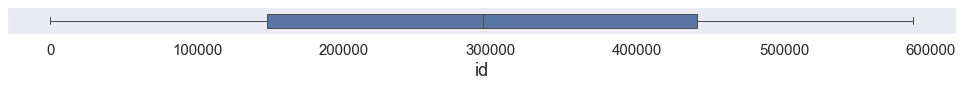

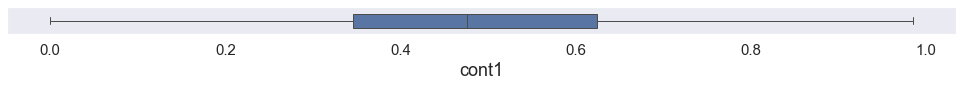

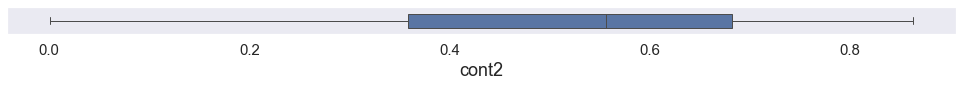

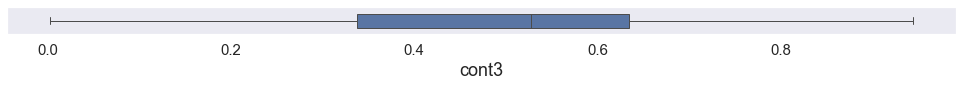

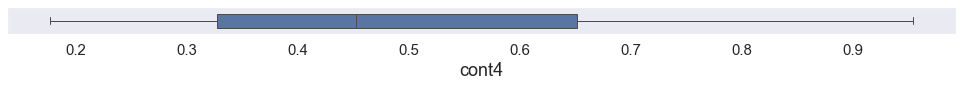

...

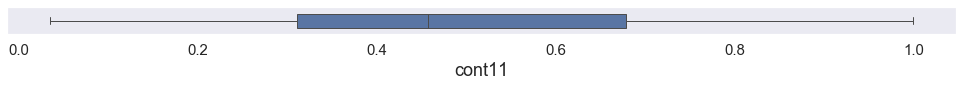

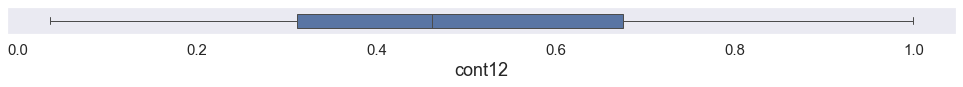

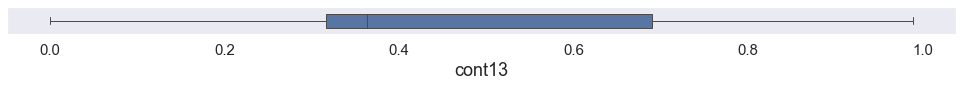

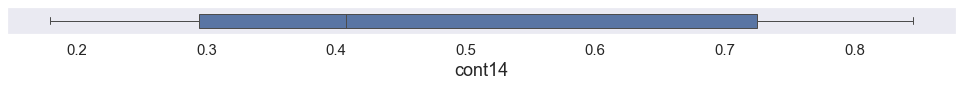

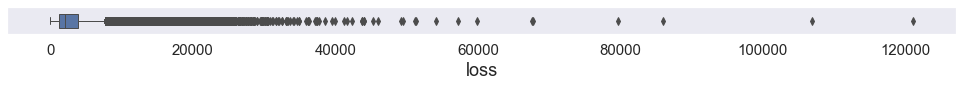

In [35]:
show_boxplot(df_train, *list_numerical_col)

---

## Data Visualization

- Continuous feature
 - Visualize data continuos
 - Correlation data continuos
 - Matrix correlation: continuous features
- Categorical feature
 - Transform categorical feature
 - Visualize data categorical
 - Matrix correlation: categorical features

In [36]:
# savefig()

def save_image(img: 'matplotlib',
               name: str,
               path: str = 'reports/images/'):
    
    fig = img.get_figure()
    fig.savefig(f"reports/images/{name}.png")
    
    return f"Image {name} saved."

#### PCA (Kernel Density Estimate)

In [37]:
### Preparing data to KDE

lable = df_train['loss'].values
dataset_visual = df_train.drop(['loss'], axis = 1)
dataset_visual = df_train[list_categorical_col].values
dataset_visual = StandardScaler().fit_transform(dataset_visual)

# import some data to play
X = dataset_visual
y = df_train['loss']

x_min, x_max = X[:, 0].min() - .5, X[:, 0].max() + .5
y_min, y_max = X[:, 1].min() - .5, X[:, 1].max() + .5

pca = PCA(n_components=3)
principalComponents  = pca.fit_transform(X)

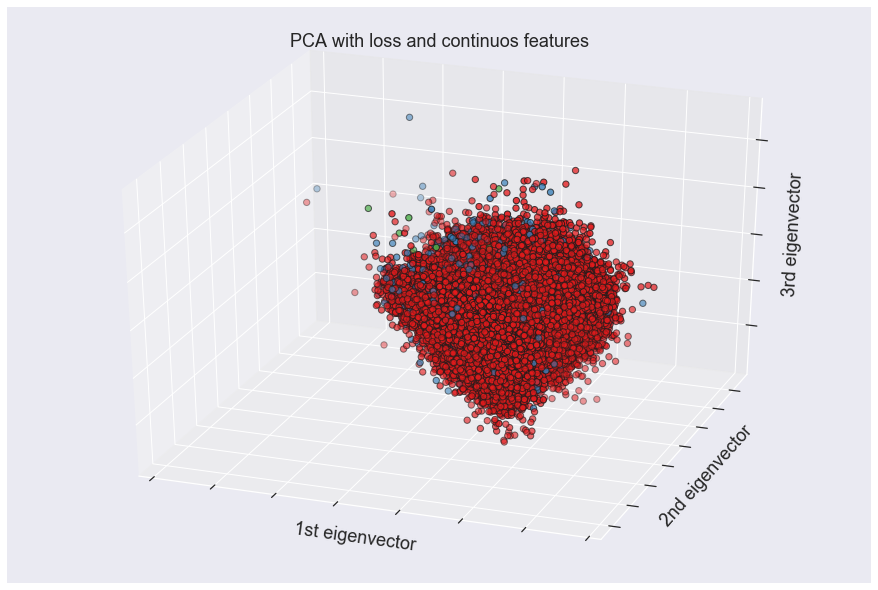

In [38]:
# Plotting a Kernel Density Estimate (KDE) with three PCA dimensions
fig3 = plt.figure(2, figsize=(12, 8))
ax2 = Axes3D(fig3, elev=-150, azim=70)
pca_img = ax2.scatter(principalComponents[:, 0],
                      principalComponents[:, 1], 
                      principalComponents[:, 2],
                      c=lable, 
                      cmap=plt.cm.Set1,
                      edgecolor='k', s=40)

ax2.set_title("PCA with loss and continuos features")
ax2.set_xlabel("1st eigenvector")
ax2.w_xaxis.set_ticklabels([])
ax2.set_ylabel("2nd eigenvector")
ax2.w_yaxis.set_ticklabels([])
ax2.set_zlabel("3rd eigenvector")
ax2.w_zaxis.set_ticklabels([])

plt.show()

In [39]:
print(pca.explained_variance_ratio_)

[0.05981928 0.04738145 0.04292431]


It is seen that the data are well grouped and presented in a PCA of 3 dimensions for each one of its components the variance of 5.97%, 4.73% and 4.29%, being a total of 14.99%.

#### Data  Continuos Distribuition

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x0000027923024408>,
      dtype=object)

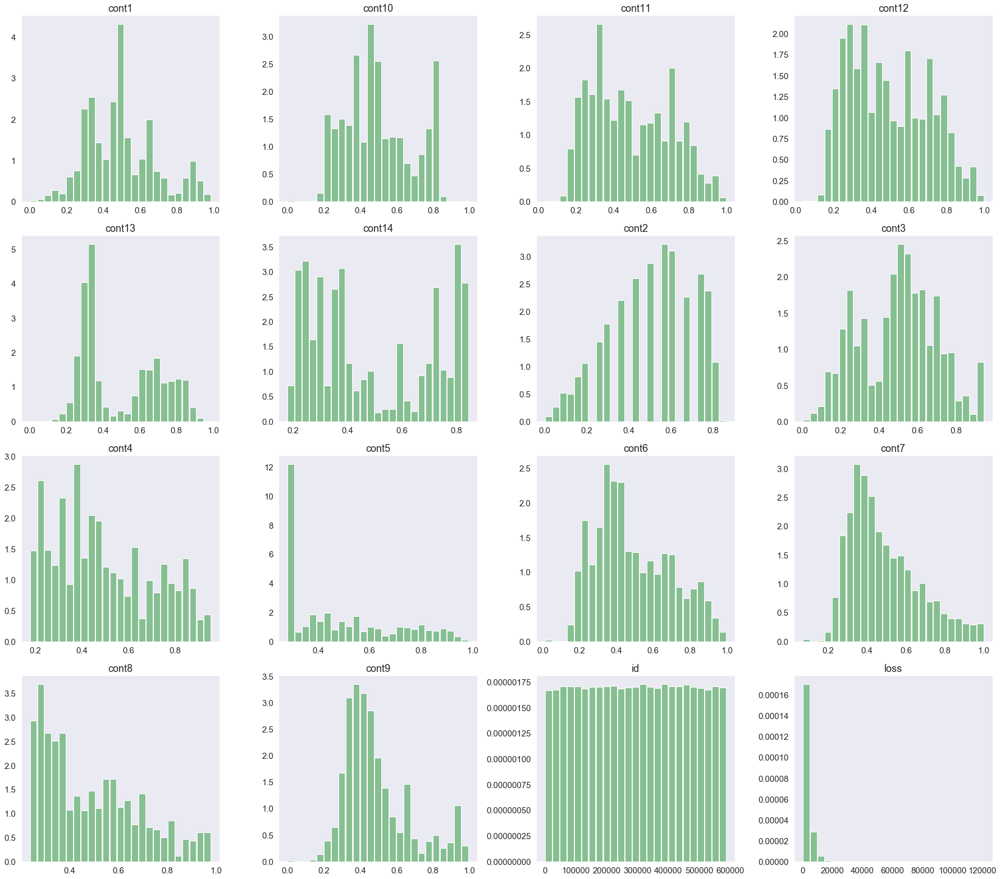

In [41]:
# the histogram of the data
df_train[list_numerical_col].hist(figsize=[25,22], 
                            density=True, 
                            bins=25, 
                            grid=False, 
                            color='#86bf91', 
                            zorder=2, 
                            rwidth=0.9)

#### Correlations

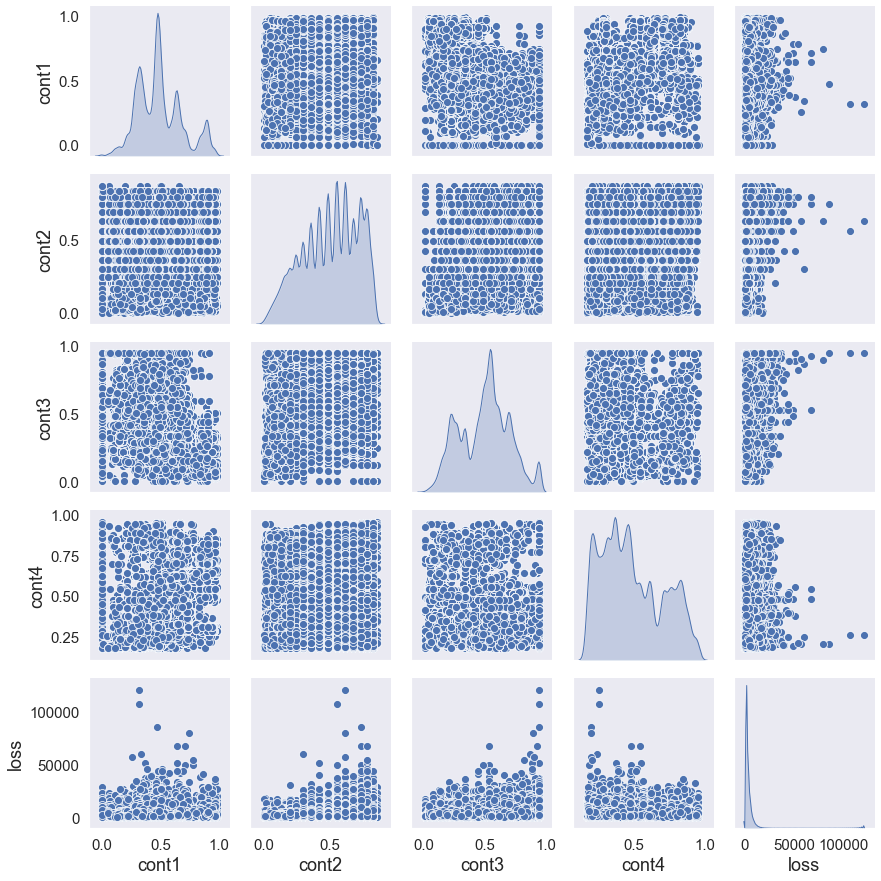

In [42]:
corr_cont_types_1_ate_4 = sns.pairplot(df_train[list_numerical_col],
                                       vars=['cont1',
                                             'cont2',
                                             'cont3',
                                             'cont4',
                                             'loss'],
                                       kind = 'scatter',
                                       diag_kind='kde')
print(corr_cont_types_1_ate_4)

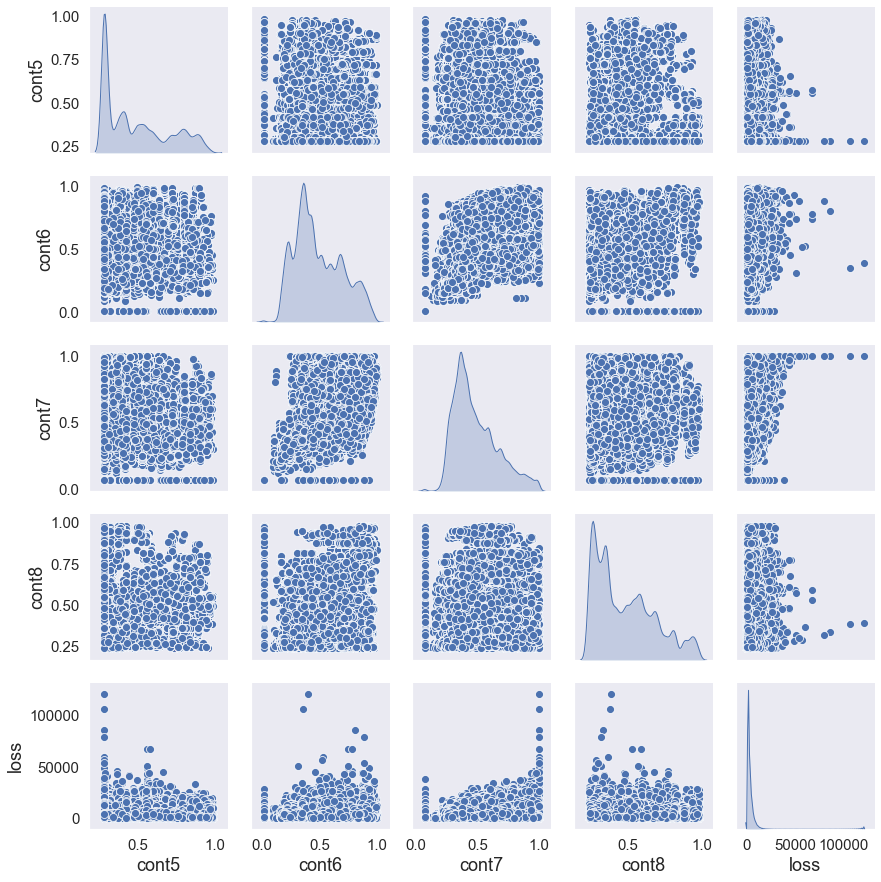

In [43]:
corr_cont_types_5_ate_8 = sns.pairplot(df_train[list_numerical_col],
                                       vars=['cont5',
                                             'cont6',
                                             'cont7',
                                             'cont8',
                                             'loss'],
                                       kind = 'scatter',
                                       diag_kind='kde')
print(corr_cont_types_5_ate_8)

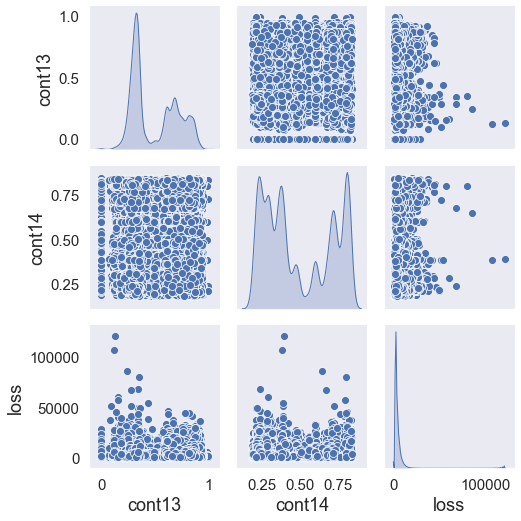

In [44]:
corr_cont_types_13_ate_14 = sns.pairplot(df_train[list_numerical_col],
                                        vars=['cont13',
                                              'cont14',
                                              'loss'],
                                        kind = 'scatter',
                                        diag_kind='kde')
print(corr_cont_types_13_ate_14)

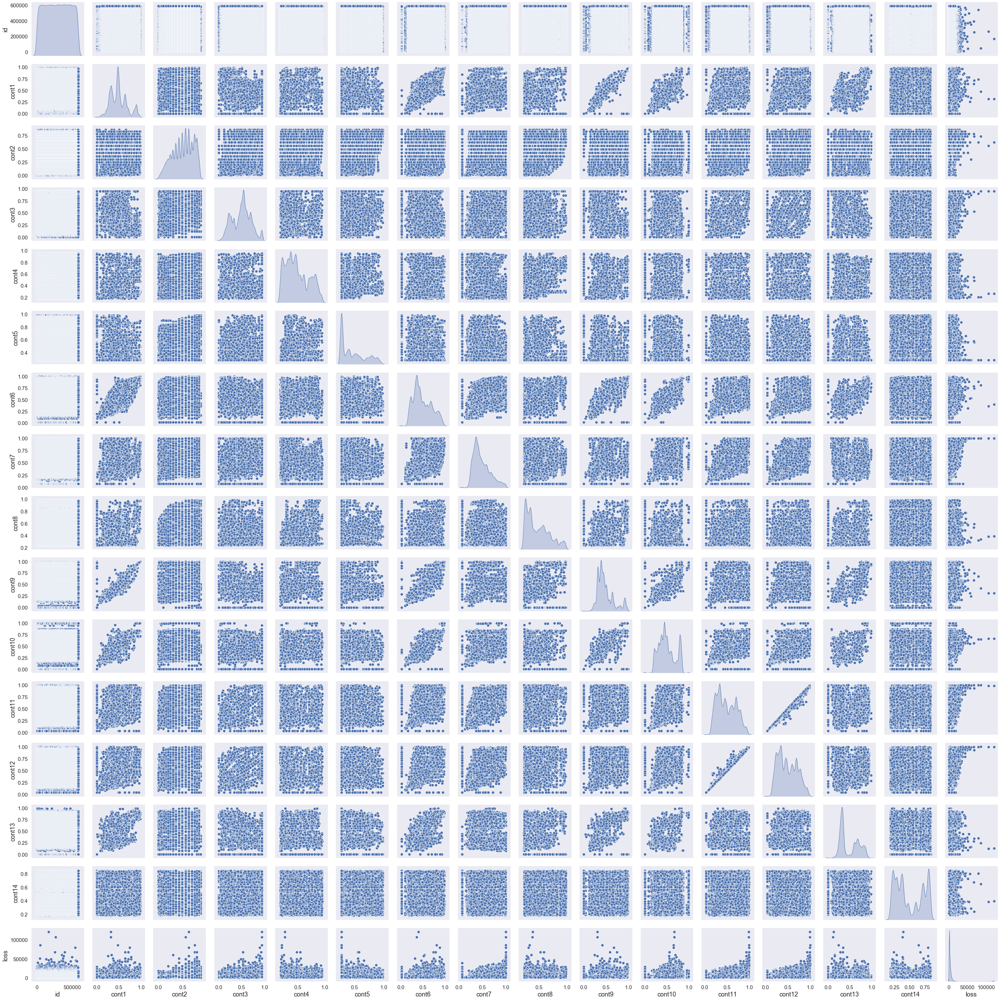

In [45]:
corr_cont_types_all = sns.pairplot(
    df_train[list_numerical_col],
    kind = 'scatter',
    diag_kind='kde')

### Matrix correlation: continuous features

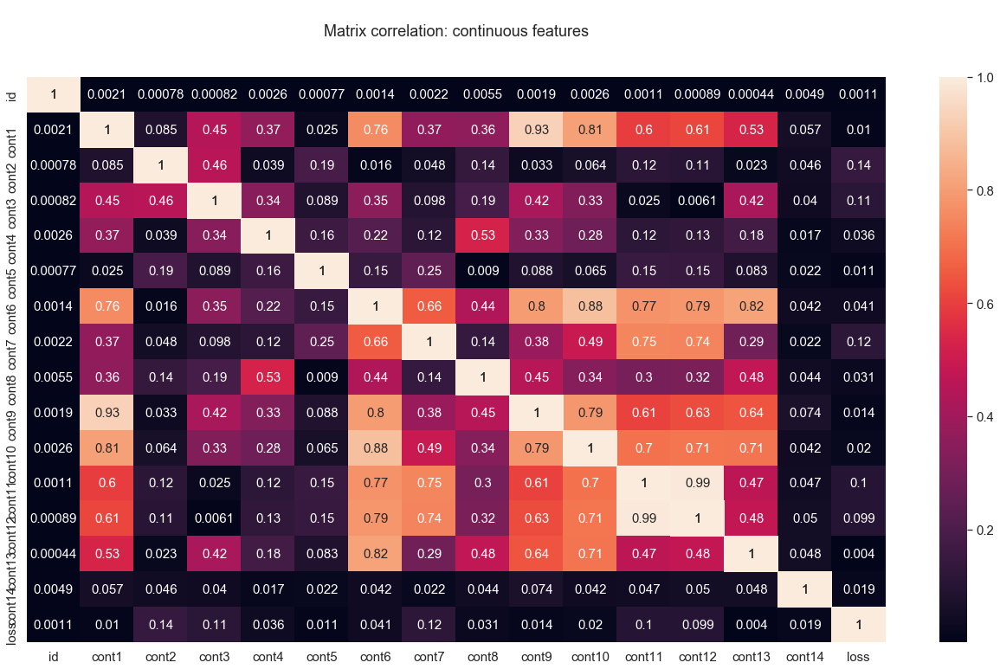

In [46]:
correlationMatrix = df_train[list_numerical_col].corr().abs()

plt.subplots(figsize=(18, 11))
plt.tight_layout() # save images without cut


sns.heatmap(correlationMatrix,annot=True)

# Mask unimportant features
corr_matrix_cont = sns.heatmap(correlationMatrix,
            mask=correlationMatrix < 1,
            cbar=False,
            linecolor='white',
            annot = True)

plt.title("\nMatrix correlation: continuous features\n\n")
plt.autoscale()
plt.show()

It`s possible see correlations exists between some of the continuous variables.
In this case, the correlations score between cont10 and cont11 is 0.7. 

### Categorical Features

#### Best Correlation

In [47]:
def top_corr(df: 'dataframe', list_col: 'list', n_corr: int = 20, corr_method: str = 'pearson') -> 'Series':
    corr_top_list = df[list_col].corr(method=corr_method).abs()

    s = corr_top_list.unstack()
    sortedSeries = s.sort_values(kind="quicksort",ascending=False)
    best_correlation = sortedSeries[sortedSeries != 1.0][0:n_corr]

    print("-"*25, "TOP CORRELATED IN PAIRS", "-"*25, end='\n\n')
    return best_correlation

In [48]:
top_corr(df=df_train,
         list_col=list_categorical_col)

------------------------- TOP CORRELATED IN PAIRS -------------------------



cat3    cat90    0.96
cat90   cat3     0.96
cat7    cat89    0.96
cat89   cat7     0.96
cat2    cat9     0.93
cat9    cat2     0.93
cat6    cat50    0.93
cat50   cat6     0.93
cat116  cat104   0.92
cat104  cat116   0.92
cat8    cat102   0.90
cat102  cat8     0.90
cat98   cat86    0.89
cat86   cat98    0.89
cat66   cat8     0.86
cat8    cat66    0.86
cat115  cat86    0.85
cat86   cat115   0.85
cat111  cat4     0.83
cat4    cat111   0.83
dtype: float64

#### Without Correlation

In [49]:
def get_without_correlation(df, list_col, target_col):
    corr_list = df[list_col].corr().abs()

    s = corr_list.unstack()
    sorted_series = s\
                    .sort_values(kind="quicksort",ascending=True)\
                        .get(target_col)

    if sorted_series is None:
        print('All columns have correlation with target column.')
        return None
    
    without_correlation = sorted_series[sorted_series < 0.1][0:-1]

    print("-"*25, "WITHOUT CORRELATED WITH TARGET", "-"*25, end='\n\n')
    print(without_correlation)
    return without_correlation.index.tolist()

In [50]:
list_without_corr = get_without_correlation(df = df_train,
                                            list_col = list_categorical_col,
                                            target_col = df_train['loss'])

All columns have correlation with target column.


### Numerical Features

#### Best Correlation

In [51]:
top_corr(df=df_train,
         list_col=list_numerical_col)

------------------------- TOP CORRELATED IN PAIRS -------------------------



cont12  cont11   0.99
cont11  cont12   0.99
cont9   cont1    0.93
cont1   cont9    0.93
cont6   cont10   0.88
cont10  cont6    0.88
cont13  cont6    0.82
cont6   cont13   0.82
cont1   cont10   0.81
cont10  cont1    0.81
cont9   cont6    0.80
cont6   cont9    0.80
cont10  cont9    0.79
cont9   cont10   0.79
cont12  cont6    0.79
cont6   cont12   0.79
cont11  cont6    0.77
cont6   cont11   0.77
        cont1    0.76
cont1   cont6    0.76
dtype: float64

#### Without Correlation

In [52]:
list_without_corr = get_without_correlation(df=df_train,
                                            list_col=list_numerical_col,
                                            target_col='loss')

------------------------- WITHOUT CORRELATED WITH TARGET -------------------------

id       0.00
cont13   0.00
cont1    0.01
cont5    0.01
cont9    0.01
cont14   0.02
cont10   0.02
cont8    0.03
cont4    0.04
cont6    0.04
cont12   0.10
dtype: float64


---

## Feature Importance

In [53]:
def get_feature_importance_df(feature_importances,
                              column_names, 
                              top_n=20):
    """
    Get feature importance data frame.
 
    Parameters
    ----------
    feature_importances : numpy ndarray
        Feature importances computed by an ensemble 
            model like random forest or boosting
    column_names : array-like
        Names of the columns in the same order as feature 
            importances
    top_n : integer
        Number of top features
 
    Returns
    -------
    df : a Pandas data frame
    """
     
    imp_dict = dict(zip(column_names, feature_importances))
    
    # get name features sorted
    top_features = sorted(imp_dict, key=imp_dict.get, reverse=True)[0:top_n]
    
    # get values
    top_importances = [imp_dict[feature] for feature in top_features]
    
    # create dataframe with feature_importance
    df = pd.DataFrame(data={'feature': top_features, 'importance': top_importances})
    return df

In [54]:
list_columns.remove('loss')

In [55]:
df_train[list_columns].head()

,id,cat1,cat2,cat3,cat4,cat5,cat6,cat7,cat8,cat9,cat10,cat11,cat12,cat13,cat14,cat15,cat16,cat17,cat18,cat19,cat20,cat21,cat22,cat23,cat24,cat25,cat26,cat27,cat28,cat29,cat30,cat31,cat32,cat33,cat34,cat35,cat36,cat37,cat38,cat39,cat40,cat41,cat42,cat43,cat44,cat45,cat46,cat47,cat48,cat49,cat50,cat51,cat52,cat53,cat54,cat55,cat56,cat57,cat58,cat59,cat60,cat61,cat62,cat63,cat64,cat65,cat66,cat67,cat68,cat69,cat70,cat71,cat72,cat73,cat74,cat75,cat76,cat77,cat78,cat79,cat80,cat81,cat82,cat83,cat84,cat85,cat86,cat87,cat88,cat89,cat90,cat91,cat92,cat93,cat94,cat95,cat96,cat97,cat98,cat99,cat100,cat101,cat102,cat103,cat104,cat105,cat106,cat107,cat108,cat109,cat110,cat111,cat112,cat113,cat114,cat115,cat116,cont1,cont2,cont3,cont4,cont5,cont6,cont7,cont8,cont9,cont10,cont11,cont12,cont13,cont14
0,1,0,1,0,1,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,3,1,1,3,3,1,3,2,1,3,1,0,0,0,0,0,3,1,2,4,0,2,15,1,6,0,0,8,4,6,9,6,45,28,2,19,55,0,14,269,0.73,0.25,0.19,0.79,0.31,0.72,0.34,0.30,0.67,0.84,0.57,0.59,0.82,0.71
1,2,0,1,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,3,1,1,3,3,0,1,2,1,3,1,0,0,0,0,0,3,3,2,4,4,3,15,11,5,0,0,4,4,8,10,10,33,65,0,22,38,0,14,85,0.33,0.74,0.59,0.61,0.89,0.44,0.44,0.60,0.35,0.44,0.34,0.37,0.61,0.30
2,5,0,1,0,0,1,0,0,0,1,1,1,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,3,1,1,1,3,1,3,2,1,1,1,0,0,0,0,0,3,3,2,4,4,0,1,11,14,0,1,4,5,7,5,0,2,85,0,28,5,0,8,153,0.26,0.36,0.48,0.24,0.40,0.29,0.32,0.27,0.26,0.32,0.38,0.37,0.20,0.77
3,10,1,1,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,3,1,1,3,3,3,1,2,1,3,1,0,0,0,0,0,3,3,2,4,4,3,15,8,3,0,0,4,4,8,10,10,33,67,2,39,4,0,14,79,0.32,0.56,0.53,0.37,0.42,0.44,0.39,0.32,0.32,0.44,0.33,0.32,0.61,0.60
4,11,0,1,0,1,0,0,0,0,1,1,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,3,1,3,1,3,1,1,2,1,1,2,0,0,0,1,5,3,1,3,4,4,0,12,5,9,0,0,3,4,10,6,1,66,50,2,50,38,0,10,55,0.27,0.16,0.53,0.47,0.70,0.18,0.25,0.25,0.22,0.21,0.20,0.20,0.25,0.43


In [56]:
# create model

rf = RandomForestRegressor(n_estimators=df_train.shape[1], # numbers tree
                            max_depth=8,
                            min_samples_leaf=df_train.shape[1],
                            max_features=0.2, # each tree utility 20% in the features
                            n_jobs=-1)

In [58]:
# trainning model

rf.fit(df_train[list_columns], df_train['loss'])

features = df_train[list_columns].columns.values

print("---Training Done---")

---Training Done---


In [59]:
# get trained model (rf) and avalible the feature_importance
feature_importance = get_feature_importance_df(rf.feature_importances_, features)

# print feature_importance in the rf randomForest
display(feature_importance)

,feature,importance
0,cat80,0.21
1,cat79,0.19
2,cat87,0.08
3,cat57,0.07
4,cat101,0.06
5,cat12,0.04
6,cat81,0.04
7,cont2,0.04
8,cat7,0.03
9,cont7,0.03


[Text(0, 0.5, 'Importance'),
 Text(0.5, 0, "Name's Variable"),
 Text(0.5, 1.0, 'Variable Importances')]

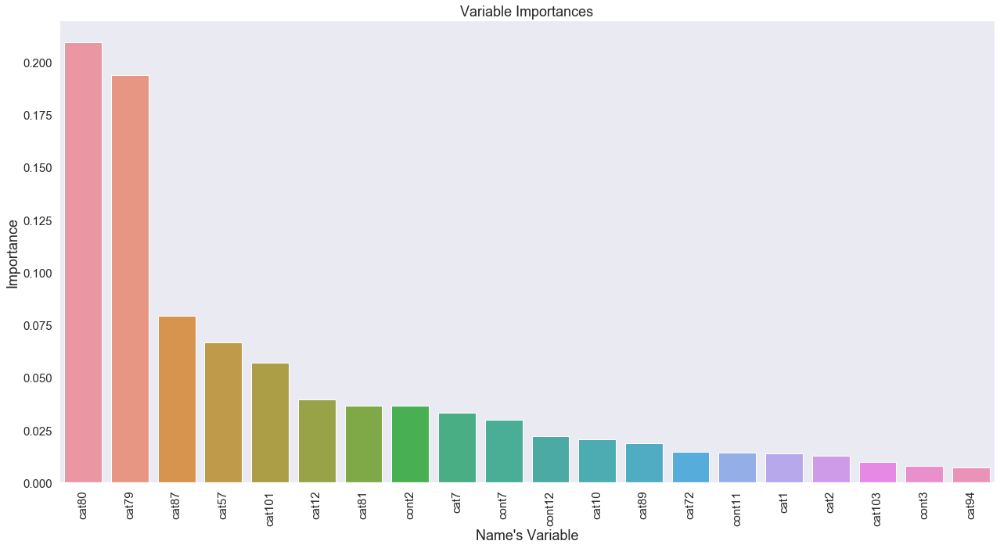

In [60]:
fig,ax = plt.subplots()
plt.xticks(rotation='vertical')

fig.set_size_inches(18,10)
sns.barplot(data=feature_importance[:20], 
            x="feature", 
            y="importance", 
            ax=ax)
ax.set(xlabel="Name's Variable",
       ylabel='Importance',
       title="Variable Importances")

### Drop Feature Without Importance and Without Correlation

In [61]:
def get_without_importance(df_feature_importance: 'dataframe') -> list:
    list_drop_col = []
              
    cond_duracao = (df_feature_importance['importance'] < 0.01)
    df_temp = df_feature_importance[cond_duracao]
    
    list_drop_col = df_temp['feature'].tolist()
    
    print("-"*25, "FEATURE WITHOUT IMPORTANCE", "-"*25, end='\n\n')
    print(df_temp)
    return list_drop_col

In [62]:
def remove_without_importace(df: 'dataframe', list_without_imp: list) -> int:
    print(f'Columns before = {df.shape[1]}')
    
    for column in list_without_imp:
        del df[column]
        
    return print(f"Columns after = {df.shape[1]}")

In [63]:
def remove_without_corr(df: 'dataframe', list_without_corr: list) -> int:
    print(f'Columns before = {df.shape[1]}')

    for column in list_without_corr:
        del df[column]
    
    return print(f"Columns after = {df.shape[1]}")

In [64]:
remove_without_corr(df_train, list_without_corr)

Columns before = 132
Columns after = 121


In [65]:
list_without_importance = get_without_importance(df_feature_importance = feature_importance)

------------------------- FEATURE WITHOUT IMPORTANCE -------------------------

   feature  importance
17  cat103        0.01
18   cont3        0.01
19   cat94        0.01


In [66]:
remove_without_importace(df = df_train,
                        list_without_imp = list_without_importance)

Columns before = 121
Columns after = 118


In [67]:
list_numerical_col = get_col(df=df_train,
                             type_descr=np.number)
list_categorical_col = get_col(df=df_train,
                               type_descr=np.object)
list_columns = get_col(df=df_train,
                       type_descr=[np.object, np.number])

Dataframe not contains <class 'object'> columns !


---

## Storage Data Cleaning

In [68]:
def save_data_clenning(df: 'dataframe' = None,
                       path: str = '') -> None:
    df.to_csv(path_or_buf = path,
              sep = ',',
              index = False,
              encoding = 'utf8')
    
    return "Data storage!"

In [69]:
save_data_clenning(df = df_train,
                   path = 'train-clean.csv')

save_data_clenning(df = df_test,
                   path = 'test-clean.csv')

'Data storage!'